In [225]:
# %matplotlib inline
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.utils import to_categorical
from pandas import read_csv
from pandas import DataFrame
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# euclidean distnce between two points:

In [226]:
def l2_dist(p1, p2):
    x1,y1 = p1
    x2,y2 = p2
    x1, y1 = np.array(x1), np.array(y1)
    x2, y2 = np.array(x2), np.array(y2)
    dx = x1 - x2
    dy = y1 - y2
    dx = dx ** 2
    dy = dy ** 2
    dists = dx + dy
    dists = np.sqrt(dists)
    return np.mean(dists), dists

# Load labeled dataset:

In [227]:
path="RSSI_Labeled.csv"
x = read_csv(path, index_col=None)

In [228]:
x.head(5)

,location,date,b3001,b3002,b3003,b3004,b3005,b3006,b3007,b3008,b3009,b3010,b3011,b3012,b3013
0,O02,10-18-2016 11:15:21,-200,-200,-200,-200,-200,-78,-200,-200,-200,-200,-200,-200,-200
1,P01,10-18-2016 11:15:19,-200,-200,-200,-200,-200,-78,-200,-200,-200,-200,-200,-200,-200
2,P01,10-18-2016 11:15:17,-200,-200,-200,-200,-200,-77,-200,-200,-200,-200,-200,-200,-200
3,P01,10-18-2016 11:15:15,-200,-200,-200,-200,-200,-77,-200,-200,-200,-200,-200,-200,-200
4,P01,10-18-2016 11:15:13,-200,-200,-200,-200,-200,-77,-200,-200,-200,-200,-200,-200,-200


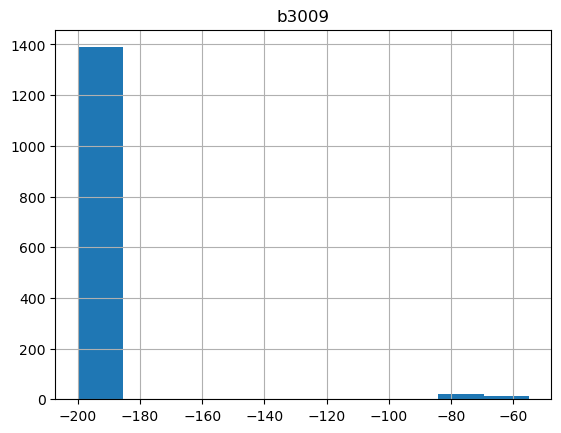

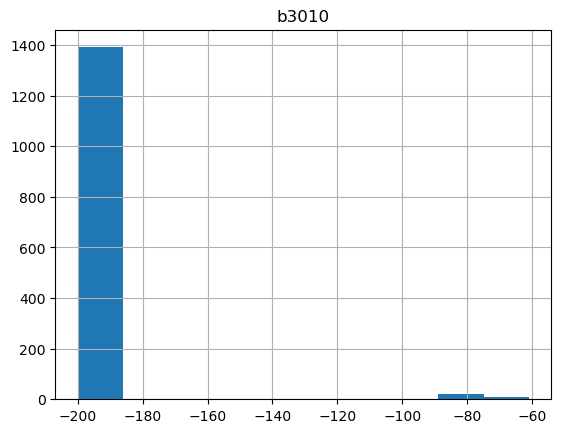

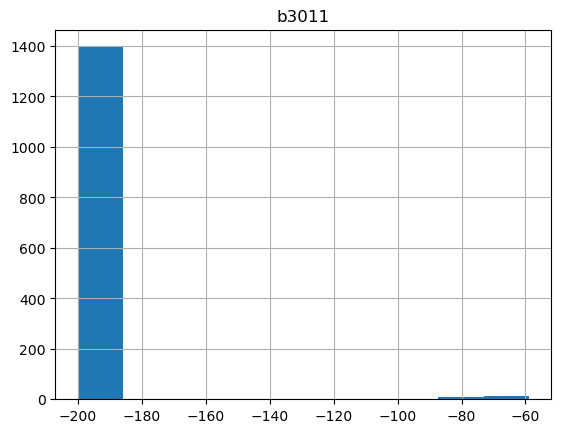

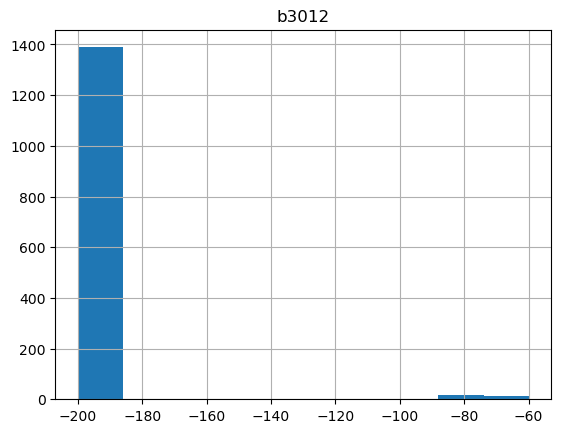

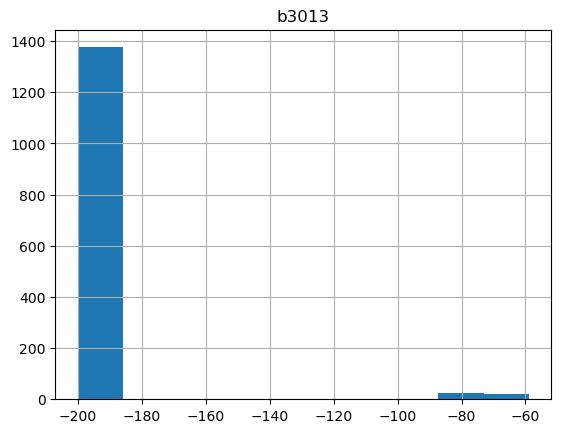

In [229]:
for col in x.columns[10:]:
    x.hist(column = col)

In [230]:
def fix_pos(x_cord):
    x = 87 - ord(x_cord.upper())
    return x

In [231]:
path='RSSI_Labeled.csv'
x = read_csv(path, index_col=None)
x['x'] = x['location'].str[0]
x['y'] = x['location'].str[1:]
x.drop(["location"], axis = 1, inplace = True)
x["x"] = x["x"].apply(fix_pos)
x["y"] = x["y"].astype(int)

In [232]:
#Doing a train test split with no shuffling in order to preserve time series information
y = x.iloc[:, -2:]
x = x.iloc[:, 1:-2]
train_x, val_x, train_y, val_y = train_test_split(x,y, test_size = .2, shuffle = False)

In [233]:
#Creating a simple MLP model like in the original work, but this time with X, Y both predicted by a single model.
from keras.optimizers import Adam
from keras.layers import BatchNormalization
from keras.callbacks import EarlyStopping
def create_deep(inp_dim):
    seed = 7
    np.random.seed(seed)
    model = Sequential()
    model.add(Dense(50, input_dim=inp_dim, activation='sigmoid'))
    model.add(BatchNormalization())
    model.add(Dense(50, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(2, activation='relu'))
    # Compile model
    model.compile(loss='mse', optimizer=Adam(.001), metrics=['mse'])
    return model

In [234]:
es = EarlyStopping(monitor='val_loss', patience=100, verbose=0, mode='auto', restore_best_weights=True)
model = create_deep(train_x.shape[1])
hist = model.fit(x = train_x, y = train_y, validation_data = (val_x,val_y), epochs=1000, batch_size=1000,  verbose=0, callbacks = [es])

C:\Users\prane\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [235]:
#Making predictions and measuring how far off the predictions are
preds = model.predict(val_x)
l2dists_mean, l2dists = l2_dist((preds[:, 0], preds[:, 1]), (val_y["x"], val_y["y"]))
print(l2dists_mean)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
2.071648892340816


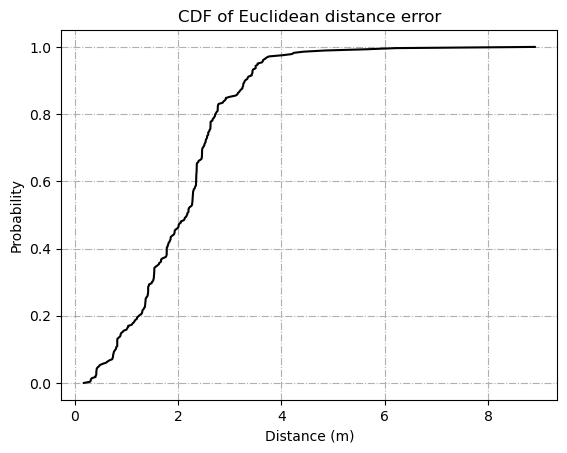

In [236]:
#Using the same CDF code from the orignal work we can visualize the error. We can see that this model is already significantly better than the original. Specifically it gets to perfect accuracy within 6 meters instead of 10
sortedl2_deep = np.sort(l2dists)
prob_deep = 1. * np.arange(len(sortedl2_deep))/(len(sortedl2_deep) - 1)
fig, ax = plt.subplots()
lg1, = ax.plot(sortedl2_deep, prob_deep, color='black')
plt.title('CDF of Euclidean distance error')
plt.xlabel('Distance (m)')
plt.ylabel('Probability')
plt.grid(True)
gridlines = ax.get_xgridlines() + ax.get_ygridlines()
for line in gridlines:
    line.set_linestyle('-.')

plt.savefig('Figure_CDF_error.png', dpi=300)
plt.show()
plt.close()


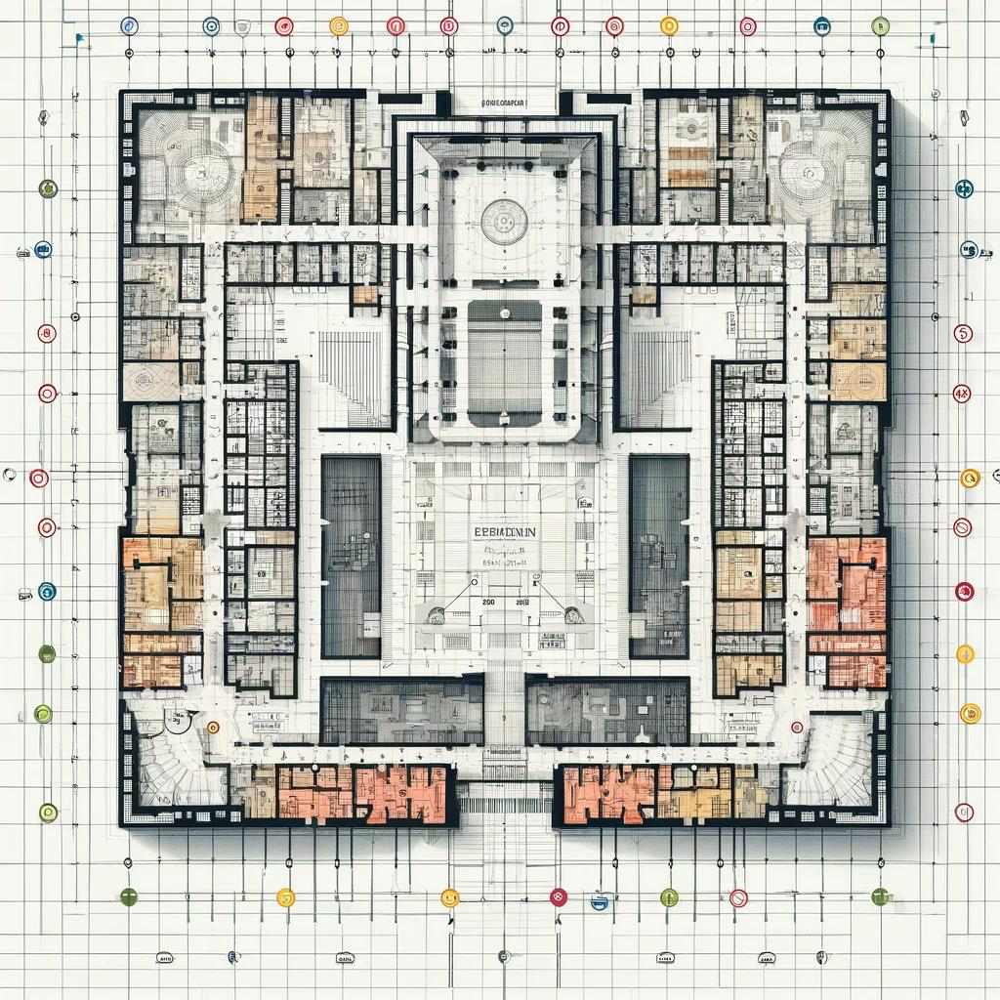

In [239]:
from plotly.offline import init_notebook_mode, iplot
from IPython.display import display, HTML
import numpy as np
from PIL import Image

image = Image.open("Layout_arch1.jpg")
init_notebook_mode(connected=True)

xm=np.min(val_y["x"])-1.5
xM=np.max(val_y["x"])+1.5
ym=np.min(val_y["y"])-1.5
yM=np.max(val_y["y"])+1.5

data=[dict(x=[0], y=[0], 
           mode="markers", name = "Predictions",
           line=dict(width=2, color='green')
          ),
      dict(x=[0], y=[0], 
           mode="markers", name = "Actual",
           line=dict(width=2, color='blue')
          )
      
    ]

layout=dict(xaxis=dict(range=[xm, 24], autorange=False, zeroline=False),
            yaxis=dict(range=[ym, 21], autorange=False, zeroline=False),
            title='Moving Dots', hovermode='closest',
            images= [dict(
                  source= image,
                  xref= "x",
                  yref= "y",
                  x= -3.5,
                  y= 22,
                  sizex= 36,
                  sizey=25,
                  sizing= "stretch",
                  opacity= 0.5,
                  layer= "below")]
            )

frames=[dict(data=[dict(x=[preds[k, 0]], 
                        y=[preds[k, 1]], 
                        mode='markers',
                        
                        marker=dict(color='red', size=10)
                        ),
                   dict(x=[val_y["x"].iloc[k]], 
                        y=[val_y["y"].iloc[k]], 
                        mode='markers',
                        
                        marker=dict(color='blue', size=10)
                        )
                  ]) for k in range(int(len(preds))) 
       ]    
          
figure1=dict(data=data, layout=layout, frames=frames)          
iplot(figure1)


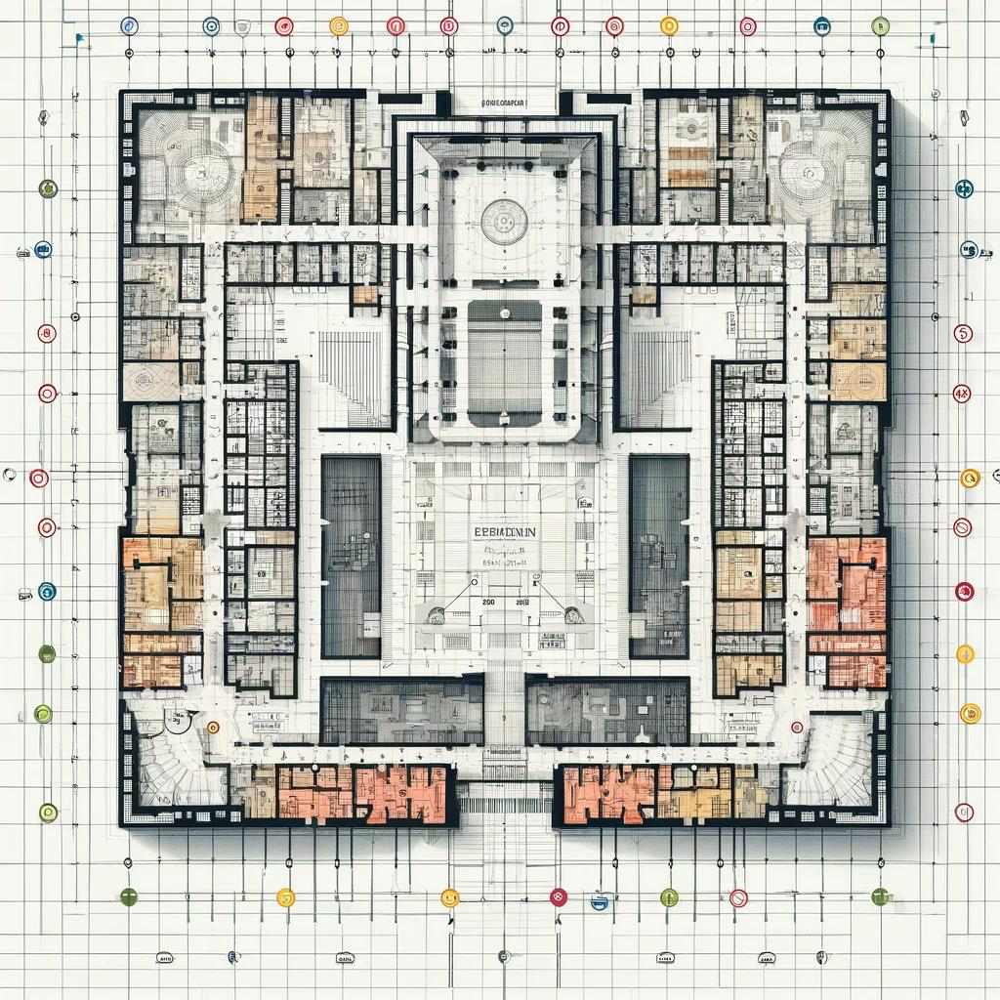

In [241]:
data=[dict(x=[1, 1], y=[16, 16], 
         mode="markers", name = "Predictions",
         line=dict(width=2, color='red')
           ),
       dict(x=[2, 2], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[3, 3], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[4, 4], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[5, 5], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[6, 6], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[7, 7], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[8, 8], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[9, 9], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[10, 10], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),       dict(x=[11, 11], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[12, 12], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[13, 13], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[14, 14], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[15, 15], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[16, 16], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[17, 17], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[18, 18], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[19, 19], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[20, 20], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[20, 20], y=[16, 16], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[20, 20], y=[17, 17], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[20, 20], y=[18, 18], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           ),
       dict(x=[20, 20], y=[19, 19], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           )
       ,
       dict(x=[20, 20], y=[0, 0], 
            mode="markers", name = "Actual",
            line=dict(width=2, color='blue')
           )
     
     ]
layout=dict(xaxis=dict(range=[xm, 24], autorange=False, zeroline=False),yaxis=dict(range=[ym, 21], autorange=False, zeroline=False),
             title='Moving Dots', hovermode='closest',
             images= [dict(
                   source= image,
                   xref= "x",
                   yref= "y",
                   x= -3.5,
                   y= 22,
                   sizex= 36,
                   sizey=25,
                   sizing= "stretch",
                   opacity= 0.5,
                   layer= "below")]
             )
figure1=dict(data=data, layout=layout)          
iplot(figure1)

# Loading in the data again for round two

In [242]:
path='RSSI_Labeled.csv'
x = read_csv(path, index_col=None)
x['x'] = x['location'].str[0]
x['y'] = x['location'].str[1:]
x.drop(["location"], axis = 1, inplace = True)
x["x"] = x["x"].apply(fix_pos)
x["y"] = x["y"].astype(int)
y = x.iloc[:, -2:]
x = x.iloc[:, 1:-2]

In [243]:
x["b3001"].values.shape

(1420,)

In [244]:
img_x = np.zeros(shape = (x.shape[0], 25, 25, 1, ))
beacon_coords = {"b3001": (5, 9), 
                 "b3002": (9, 14), 
                 "b3003": (13, 14), 
                 "b3004": (18, 14), 
                 "b3005": (9, 11), 
                 "b3006": (13, 11), 
                 "b3007": (18, 11), 
                 "b3008": (9, 8), 
                 "b3009": (2, 3), 
                 "b3010": (9, 3), 
                 "b3011": (13, 3), 
                 "b3012": (18, 3), 
                 "b3013": (22, 3),}
for key, value in beacon_coords.items():
    img_x[:, value[0], value[1], 0] -= x[key].values/200
    print(key, value)
# img_x = (img_x) / 200
train_x, val_x, train_y, val_y = train_test_split(img_x, y, test_size = .2, shuffle = False)

b3001 (5, 9)
b3002 (9, 14)
b3003 (13, 14)
b3004 (18, 14)
b3005 (9, 11)
b3006 (13, 11)
b3007 (18, 11)
b3008 (9, 8)
b3009 (2, 3)
b3010 (9, 3)
b3011 (13, 3)
b3012 (18, 3)
b3013 (22, 3)


In [245]:
img_x[103, :, :, 0].mean()

0.019824

In [246]:
#how one sample looks like 
img_x[1, :, :, 0]

array([[0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
        0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  ,
        0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0

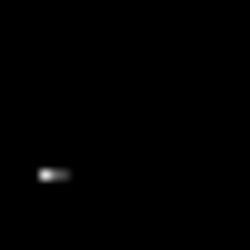

In [247]:
img = Image.fromarray(img_x[19, :, :, 0] * 255, "L")
img.resize((250, 250))

In [248]:
from keras.layers import Input
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Conv2DTranspose

In [249]:
#I am choosing to use RMSE so the far errors are penalized more heavily.
from keras import backend as K
def rmse(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true), axis=-1)) 

In [250]:
import tensorflow as tf

def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true), axis=-1))

In [251]:
#I use a semi-standard CNN model in order to predict the x, y coordinates given the signal strength.
inputs = Input(shape=(train_x.shape[1], train_x.shape[2], 1))

# a layer instance is callable on a tensor, and returns a tensor
x = Conv2D(3, kernel_size=(3,3), activation='relu', padding = "valid", data_format="channels_last")(inputs)
x = MaxPooling2D(2)(x)
x = Conv2D(6, kernel_size=(3,3), activation='relu', padding = "valid", data_format="channels_last")(x)
x = MaxPooling2D(2)(x)
x = Conv2D(12, kernel_size=(3,3), activation='relu', padding = "valid", data_format="channels_last")(x)
predictions = Dense(2, activation='relu')(Flatten()(x))

# This creates a model that includes
# the Input layer and three Dense layers
model = Model(inputs=inputs, outputs=predictions)
model.compile(optimizer=Adam(.001),
              loss=rmse,
              metrics=['accuracy'])
model.summary()
hist = model.fit(x = train_x, y = train_y, validation_data = (val_x,val_y), epochs=1000, batch_size=200,  verbose=0, callbacks = [es])

Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)          │ (None, 25, 25, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_45 (Conv2D)                   │ (None, 23, 23, 3)           │              30 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_30 (MaxPooling2D)      │ (None, 11, 11, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_46 (Conv2D)                   │ (None, 9, 9, 6)             │             168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_31 (MaxPooling2D)      │ (None, 4, 4, 6)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_47 (Conv2D)                   │ (None, 2, 2, 12)            │             660 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_11 (Flatten)                 │ (None, 48)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 2)                   │              98 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 956 (3.73 KB)

 Trainable params: 956 (3.73 KB)

 Non-trainable params: 0 (0.00 B)

In [252]:
#Slightly worse performance, but I'm sure with a more tuned system it could at least equal the previous method and I would still argue this is a better setup because it is possible to generalize.
preds = model.predict(val_x)
l2dists_mean, l2dists = l2_dist((preds[:, 0], preds[:, 1]), (val_y["x"], val_y["y"]))
print(l2dists_mean)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
2.38420363921636


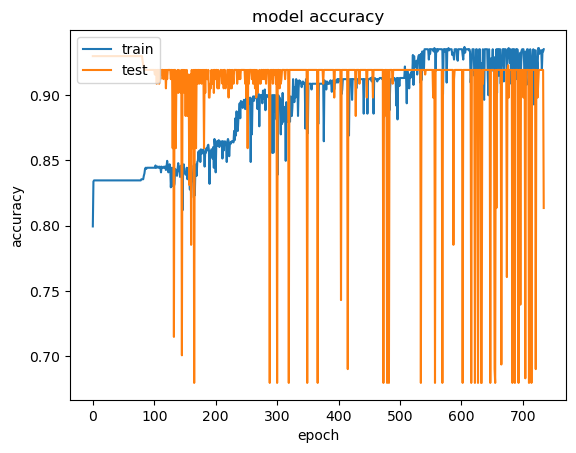

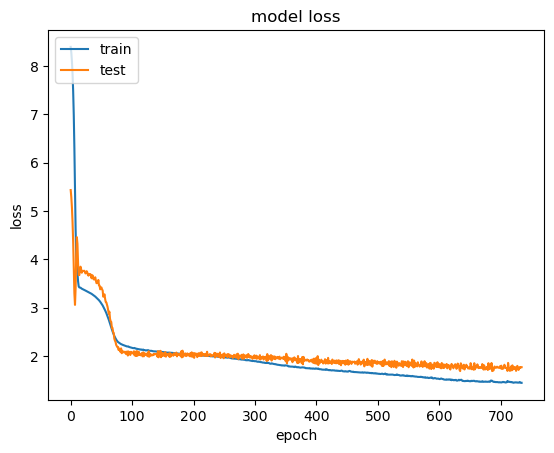

In [253]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

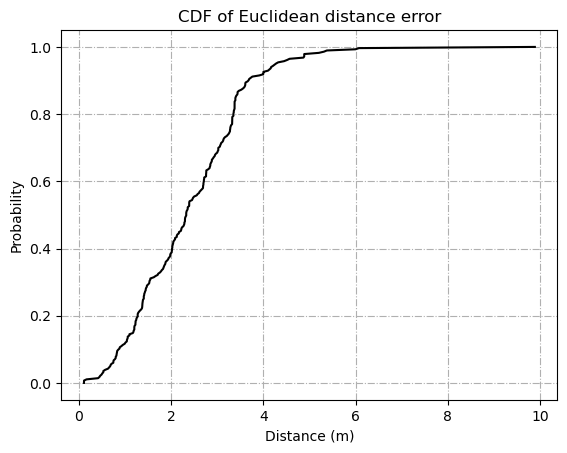

In [254]:
sortedl2_deep = np.sort(l2dists)
prob_deep = 1. * np.arange(len(sortedl2_deep))/(len(sortedl2_deep) - 1)
fig, ax = plt.subplots()
lg1, = ax.plot(sortedl2_deep, prob_deep, color='black')
plt.title('CDF of Euclidean distance error')
plt.xlabel('Distance (m)')
plt.ylabel('Probability')
plt.grid(True)
gridlines = ax.get_xgridlines() + ax.get_ygridlines()
for line in gridlines:
    line.set_linestyle('-.')

plt.savefig('Figure_CDF_error.png', dpi=300)
plt.show()
plt.close()


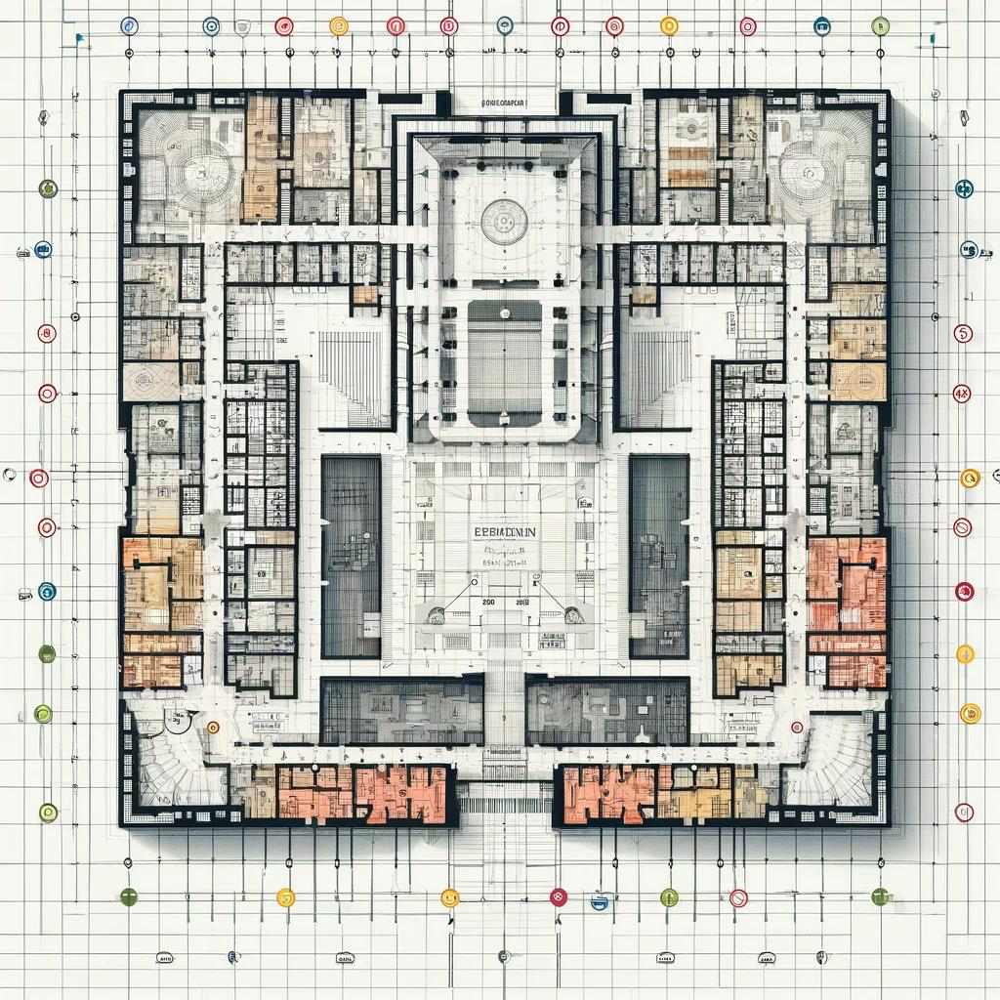

In [255]:
from plotly.offline import init_notebook_mode, iplot
from IPython.display import display, HTML
import numpy as np
from PIL import Image

image = Image.open("Layout_arch1.jpg")
init_notebook_mode(connected=True)

xm=np.min(val_y["x"])-1.5
xM=np.max(val_y["x"])+1.5
ym=np.min(val_y["y"])-1.5
yM=np.max(val_y["y"])+1.5

data=[dict(x=[0], y=[0], 
           mode="markers", name = "Predictions",
           line=dict(width=2, color='green')
          ),
      dict(x=[0], y=[0], 
           mode="markers", name = "Actual",
           line=dict(width=2, color='blue')
          )
      
    ]

layout=dict(xaxis=dict(range=[xm, 24], autorange=False, zeroline=False),
            yaxis=dict(range=[ym, 21], autorange=False, zeroline=False),
            title='Moving Dots', hovermode='closest',
            images= [dict(
                  source= image,
                  xref= "x",
                  yref= "y",
                  x= -3.5,
                  y= 22,
                  sizex= 36,
                  sizey=25,
                  sizing= "stretch",
                  opacity= 0.5,
                  layer= "below")]
            )

frames=[dict(data=[dict(x=[preds[k, 0]], 
                        y=[preds[k, 1]], 
                        mode='markers',
                        
                        marker=dict(color='red', size=10)
                        ),
                   dict(x=[val_y["x"].iloc[k]], 
                        y=[val_y["y"].iloc[k]], 
                        mode='markers',
                        
                        marker=dict(color='blue', size=10)
                        )
                  ]) for k in range(int(len(preds))) 
       ]    
          
figure1=dict(data=data, layout=layout, frames=frames)          
iplot(figure1)


# Loading in the unlabeled data for pretraining

In [261]:
path='RSSI_Unlabeled.csv'
x_un = read_csv(path, index_col=None)
#x['x'] = x['location'].str[0]
#x['y'] = x['location'].str[1:]
x_un.drop(["location", "date"], axis = 1, inplace = True)
#x["x"] = x["x"].apply(fix_pos)
#x["y"] = x["y"].astype(int)
# Split data into features (x) and targets (y)
y = x_un.iloc[:, -2:]
x = x_un.iloc[:, 1:-2]

# Convert Pandas dataframes to Keras tensors
x = x.to_numpy()
y = y.to_numpy()

In [262]:
img_x = np.zeros(shape = (x_un.shape[0], 25, 25, 1, ))
beacon_coords = {"b3001": (5, 9), 
                 "b3002": (9, 14), 
                 "b3003": (13, 14), 
                 "b3004": (18, 14), 
                 "b3005": (9, 11), 
                 "b3006": (13, 11), 
                 "b3007": (18, 11), 
                 "b3008": (9, 8), 
                 "b3009": (2, 3), 
                 "b3010": (9, 3), 
                 "b3011": (13, 3), 
                 "b3012": (18, 3), 
                 "b3013": (22, 3),}
for key, value in beacon_coords.items():
    img_x[:, value[0], value[1], 0]  -= x_un[key].values/200
    print(key, value)
train_x_un, val_x_un = train_test_split(img_x, test_size = .2, shuffle = False)

b3001 (5, 9)
b3002 (9, 14)
b3003 (13, 14)
b3004 (18, 14)
b3005 (9, 11)
b3006 (13, 11)
b3007 (18, 11)
b3008 (9, 8)
b3009 (2, 3)
b3010 (9, 3)
b3011 (13, 3)
b3012 (18, 3)
b3013 (22, 3)


In [263]:
from keras.layers import GaussianNoise, AveragePooling2D, SpatialDropout2D
inputs = Input(shape=(train_x.shape[1], train_x.shape[2], 1))

# a layer instance is callable on a tensor, and returns a tensor
x = Conv2D(24, kernel_size=(3,3), activation='relu', padding = "valid", data_format="channels_last")(inputs)
x = MaxPooling2D(2)(x)
x = Conv2D(24, kernel_size=(3,3), activation='relu', padding = "valid", data_format="channels_last")(x)
x = MaxPooling2D(2)(x)
x = Conv2D(24, kernel_size=(3,3), activation='relu', padding = "valid", data_format="channels_last")(x)
x = Conv2DTranspose(24, kernel_size=(3,3),strides = (2,2), activation='relu', padding = "valid", data_format="channels_last")(x)
x = Conv2DTranspose(16, kernel_size=(3,3),strides = (2,2), activation='relu', padding = "valid", data_format="channels_last")(x)
x = Conv2DTranspose(8, kernel_size=(3,3),strides = (2,2), activation='relu', padding = "valid", data_format="channels_last")(x)
x = Conv2DTranspose(1, kernel_size=(3,3), activation='relu', padding = "valid", data_format="channels_last")(x)

# This creates a model that includes
# the Input layer and three Dense layers
model2 = Model(inputs=inputs, outputs=x)
model2.compile(optimizer=Adam(.0001, clipnorm = .5),
              loss='mse',
              metrics=['accuracy'])


model2.compile(optimizer=Adam(.0001,clipvalue = .5),
              loss='mse',
              metrics=['accuracy'])


model2.summary()
hist = model2.fit(x = train_x_un, y = train_x_un, validation_data = (val_x_un,val_x_un),epochs=15, batch_size=10, verbose=2, callbacks = [es])

Model: "functional_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)          │ (None, 25, 25, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_48 (Conv2D)                   │ (None, 23, 23, 24)          │             240 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_32 (MaxPooling2D)      │ (None, 11, 11, 24)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_49 (Conv2D)                   │ (None, 9, 9, 24)            │           5,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_33 (MaxPooling2D)      │ (None, 4, 4, 24)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_50 (Conv2D)                   │ (None, 2, 2, 24)            │           5,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_40                  │ (None, 5, 5, 24)            │           5,208 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_41                  │ (None, 11, 11, 16)          │           3,472 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_42                  │ (None, 23, 23, 8)           │           1,160 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_43                  │ (None, 25, 25, 1)           │              73 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 20,569 (80.35 KB)

 Trainable params: 20,569 (80.35 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
416/416 - 3s - 8ms/step - accuracy: 0.9894 - loss: 0.0064 - val_accuracy: 0.9967 - val_loss: 9.3052e-04
Epoch 2/15
416/416 - 1s - 4ms/step - accuracy: 0.9960 - loss: 8.4015e-04 - val_accuracy: 0.9967 - val_loss: 8.3901e-04
Epoch 3/15
416/416 - 1s - 4ms/step - accuracy: 0.9960 - loss: 7.2536e-04 - val_accuracy: 0.9967 - val_loss: 7.2573e-04
Epoch 4/15
416/416 - 1s - 4ms/step - accuracy: 0.9960 - loss: 5.6071e-04 - val_accuracy: 0.9967 - val_loss: 5.6048e-04
Epoch 5/15
416/416 - 2s - 4ms/step - accuracy: 0.9960 - loss: 4.2133e-04 - val_accuracy: 0.9967 - val_loss: 4.6252e-04
Epoch 6/15
416/416 - 2s - 4ms/step - accuracy: 0.9960 - loss: 3.2746e-04 - val_accuracy: 0.9967 - val_loss: 3.7085e-04
Epoch 7/15
416/416 - 2s - 4ms/step - accuracy: 0.9960 - loss: 2.5944e-04 - val_accuracy: 0.9967 - val_loss: 3.0427e-04
Epoch 8/15
416/416 - 2s - 4ms/step - accuracy: 0.9960 - loss: 2.1339e-04 - val_accuracy: 0.9967 - val_loss: 2.5428e-04
Epoch 9/15
416/416 - 2s - 4ms/step - accuracy: 0.996

In [264]:
predictions = Dense(8, activation='relu')(Flatten()(model2.layers[5].output))
predictions = Dense(2, activation = 'relu')(predictions)

In [265]:
model3 = Model(inputs=model2.input, outputs=predictions)

In [266]:
model3.summary()

Model: "functional_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)          │ (None, 25, 25, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_48 (Conv2D)                   │ (None, 23, 23, 24)          │             240 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_32 (MaxPooling2D)      │ (None, 11, 11, 24)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_49 (Conv2D)                   │ (None, 9, 9, 24)            │           5,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_33 (MaxPooling2D)      │ (None, 4, 4, 24)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_50 (Conv2D)                   │ (None, 2, 2, 24)            │           5,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_12 (Flatten)                 │ (None, 96)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 8)                   │             776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 2)                   │              18 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,450 (44.73 KB)

 Trainable params: 11,450 (44.73 KB)

 Non-trainable params: 0 (0.00 B)

In [267]:
for layer in model3.layers[:-2]:
    layer.trainable = False
model3.compile(optimizer=Adam(.001, clipnorm = .5),
              loss=rmse,
              metrics=['accuracy'])

model3.compile(optimizer=Adam(.001,clipvalue = .5),
              loss=rmse,
              metrics=['accuracy'])

In [272]:
hist = model3.fit(x = train_x, y = train_y, validation_data = (val_x,val_y), epochs=500, batch_size=50,  verbose=0, callbacks = [es])

In [273]:
preds = model3.predict(val_x)
l2dists_mean, l2dists = l2_dist((preds[:, 0], preds[:, 1]), (val_y["x"], val_y["y"]))
print(l2dists_mean)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
5.050031691676171


In [274]:
print(hist.history.keys())

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


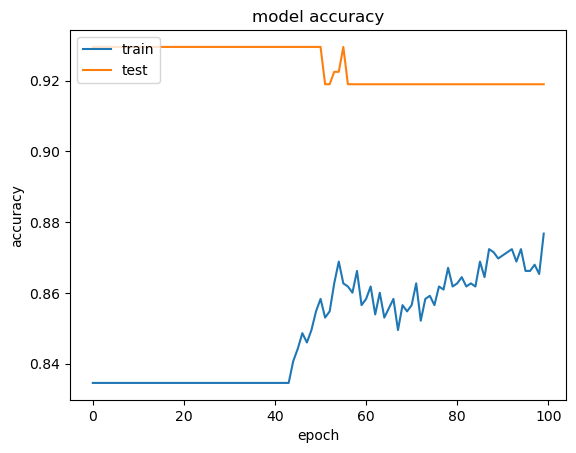

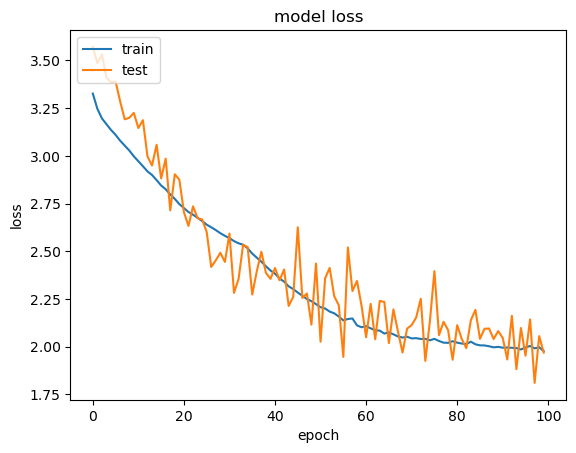

In [275]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [280]:
for layer in model3.layers[:-2]:
    layer.trainable = True
model3.compile(optimizer=Adam(.001, clipnorm = .5),
              loss=rmse,
              metrics=['accuracy'])

model3.compile(optimizer=Adam(.001,clipvalue = .5),
              loss=rmse,
              metrics=['accuracy'])


hist = model3.fit(x = train_x, y = train_y, validation_data = (val_x,val_y), epochs=500, batch_size=50,  verbose=0, callbacks = [es])
preds = model3.predict(val_x)
l2dists_mean, l2dists = l2_dist((preds[:, 0], preds[:, 1]), (val_y["x"], val_y["y"]))
print(l2dists_mean)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
4.944538660428847


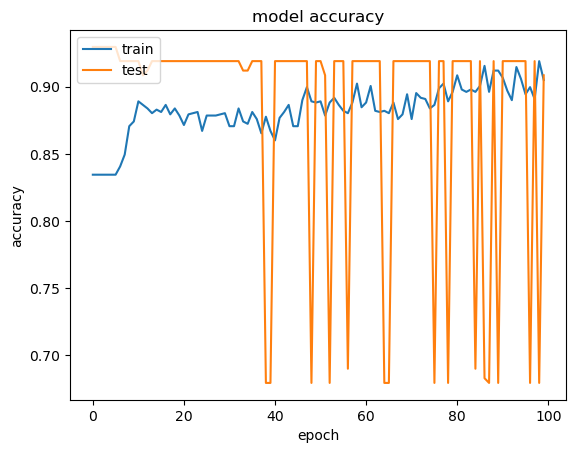

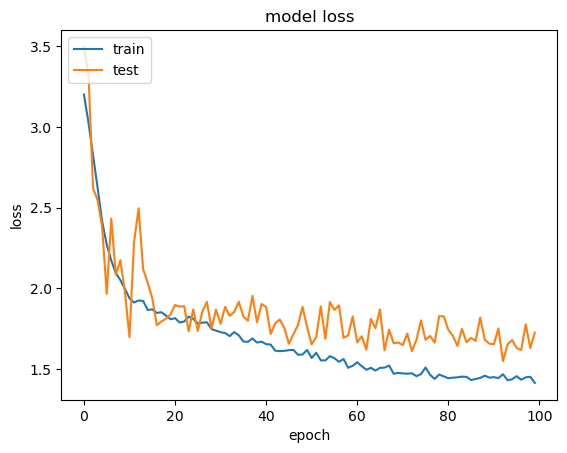

In [281]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


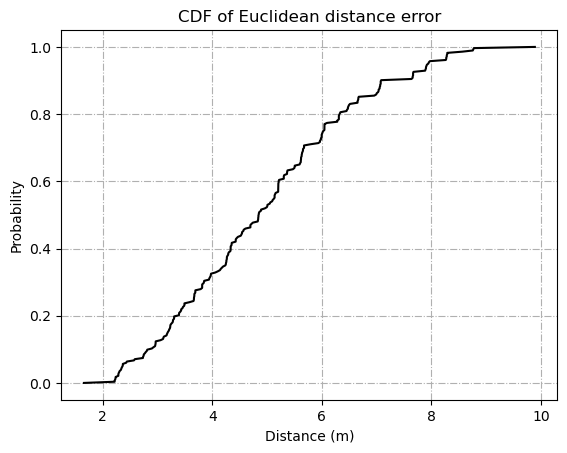

In [282]:
sortedl2_deep = np.sort(l2dists)
prob_deep = 1. * np.arange(len(sortedl2_deep))/(len(sortedl2_deep) - 1)
fig, ax = plt.subplots()
lg1, = ax.plot(sortedl2_deep, prob_deep, color='black')
plt.title('CDF of Euclidean distance error')
plt.xlabel('Distance (m)')
plt.ylabel('Probability')
plt.grid(True)
gridlines = ax.get_xgridlines() + ax.get_ygridlines()
for line in gridlines:
    line.set_linestyle('-.')

plt.savefig('Figure_CDF_error.png', dpi=300)
plt.show()
plt.close()


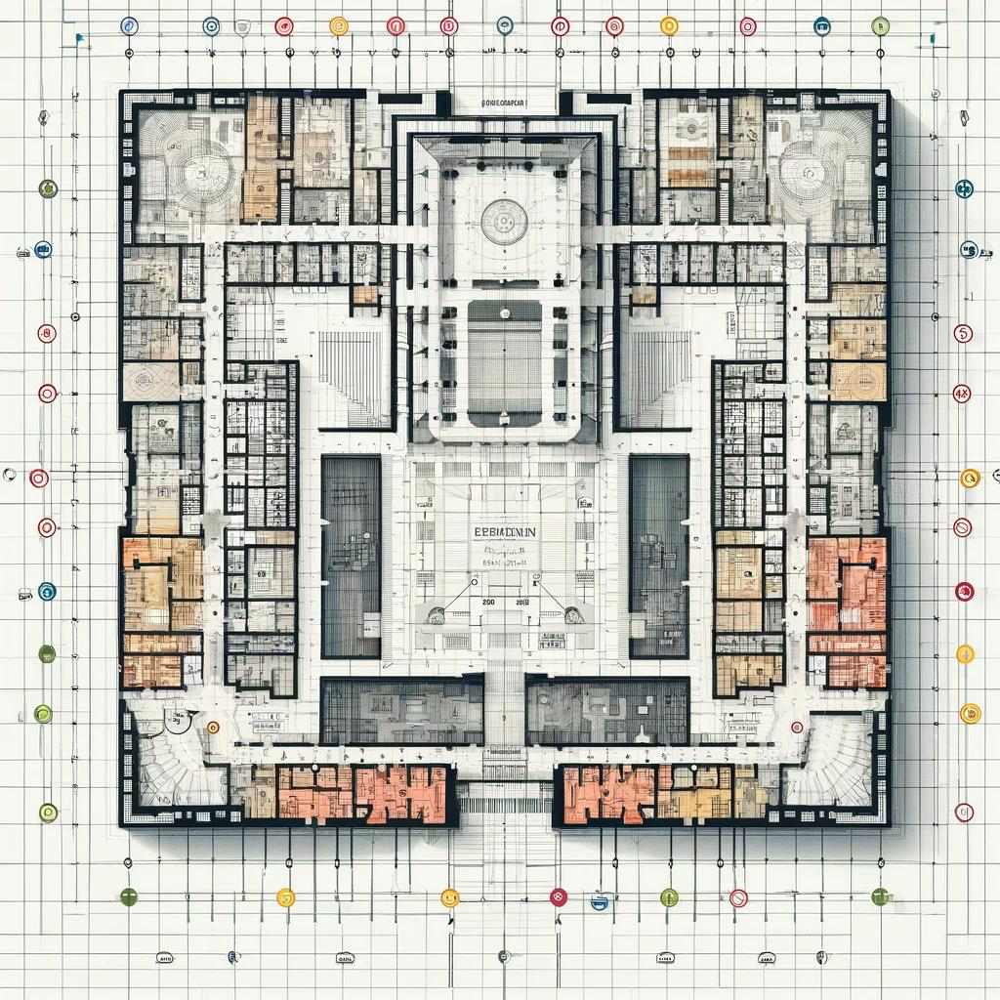

In [283]:
from plotly.offline import init_notebook_mode, iplot
from IPython.display import display, HTML
import numpy as np
from PIL import Image

image = Image.open("Layout_arch1.jpg")
init_notebook_mode(connected=True)

xm=np.min(val_y["x"])-1.5
xM=np.max(val_y["x"])+1.5
ym=np.min(val_y["y"])-1.5
yM=np.max(val_y["y"])+1.5

data=[dict(x=[0], y=[0], 
           mode="markers", name = "Predictions",
           line=dict(width=2, color='green')
          ),
      dict(x=[0], y=[0], 
           mode="markers", name = "Actual",
           line=dict(width=2, color='blue')
          )
      
    ]

layout=dict(xaxis=dict(range=[xm, 24], autorange=False, zeroline=False),
            yaxis=dict(range=[ym, 21], autorange=False, zeroline=False),
            title='Moving Dots', hovermode='closest',
            images= [dict(
                  source= image,
                  xref= "x",
                  yref= "y",
                  x= -3.5,
                  y= 22,
                  sizex= 36,
                  sizey=25,
                  sizing= "stretch",
                  opacity= 0.5,
                  layer= "below")]
            )

frames=[dict(data=[dict(x=[preds[k, 0]], 
                        y=[preds[k, 1]], 
                        mode='markers',
                        
                        marker=dict(color='red', size=10)
                        ),
                   dict(x=[val_y["x"].iloc[k]], 
                        y=[val_y["y"].iloc[k]], 
                        mode='markers',
                        
                        marker=dict(color='blue', size=10)
                        )
                  ]) for k in range(int(len(preds))) 
       ]    
          
figure1=dict(data=data, layout=layout, frames=frames)          
iplot(figure1)